## The goals / steps of this project are the following:
1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature
   and vehicle position.

In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Camera calibration

In [2]:
def camera_calibration(image_path, show=False):
    '''
    This routine performs camera calibration
    it returns `mtx` and `dist` needed to
    undistort images taken from this camera
    '''

    # list all calibration images paths
    cal_images = glob.glob(image_path)

    # chessboard-specific parameters
    nx = 9
    ny = 6

    # code below is based on classroom example
    objpoints = [] # 3D points
    imgpoints = [] # 2D points

    # (x,y,z): (0,0,0), (1,0,0), etc
    objp = np.zeros((nx * ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x, y coordinates, z stays 0

    for fname in cal_images:
        # read in image
        img = cv2.imread(fname)

        # convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # find chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # in case chessboard was found successfully
        # it skips 3 images that do not show full chessboard (1, 4 and 5)
        if ret == True:
            # image points will be different for each calibration image
            imgpoints.append(corners)
            # object points are the same for all calibration images
            objpoints.append(objp)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            if show == True:
                plt.figure(figsize=(15,10))
                plt.imshow(img)

    # calibration parameters calculation
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints,
                                                       imgpoints,
                                                       gray.shape[::-1],
                                                       None, None)

    # will only use `mtx` and `dist` in this project, hence return
    return mtx, dist

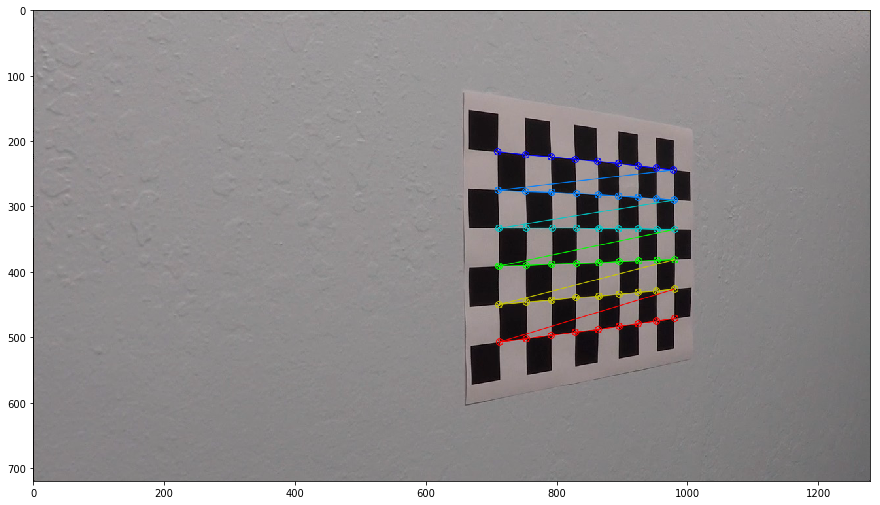

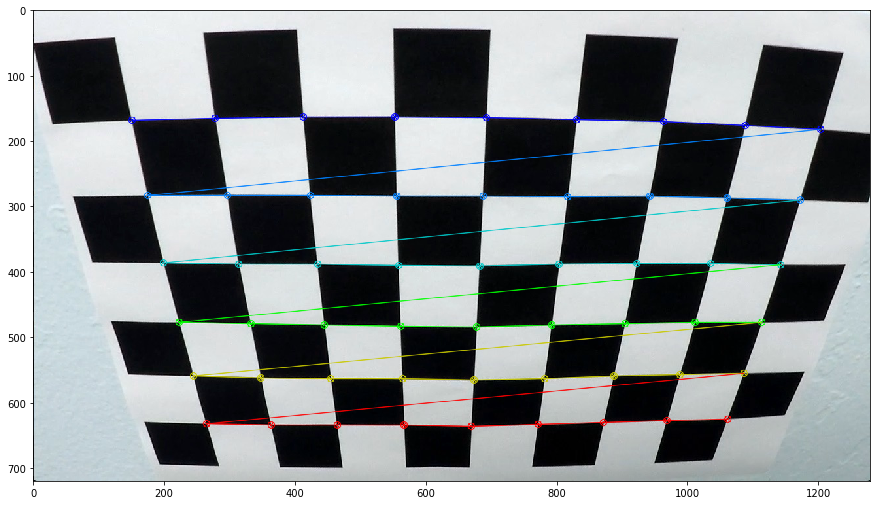

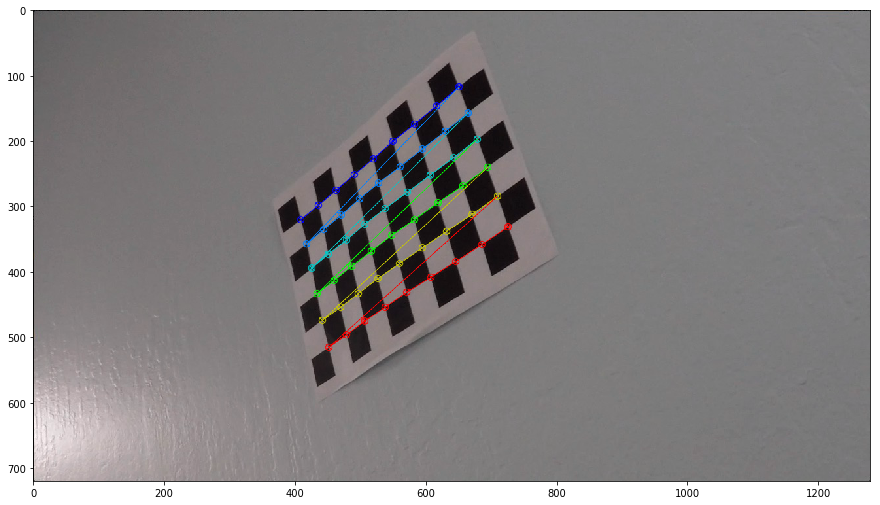

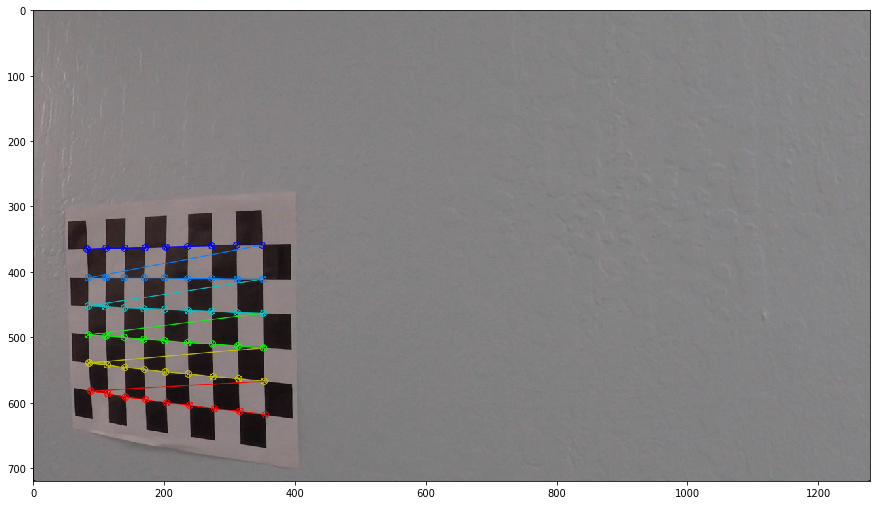

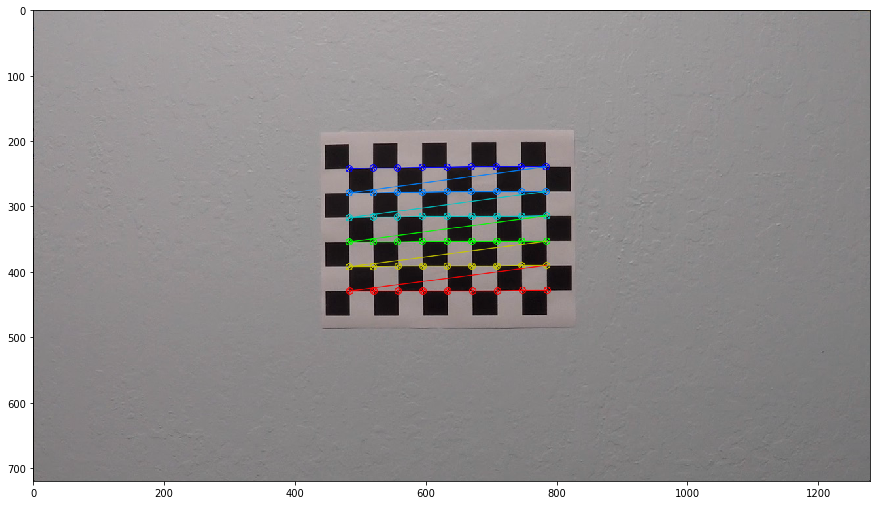

...

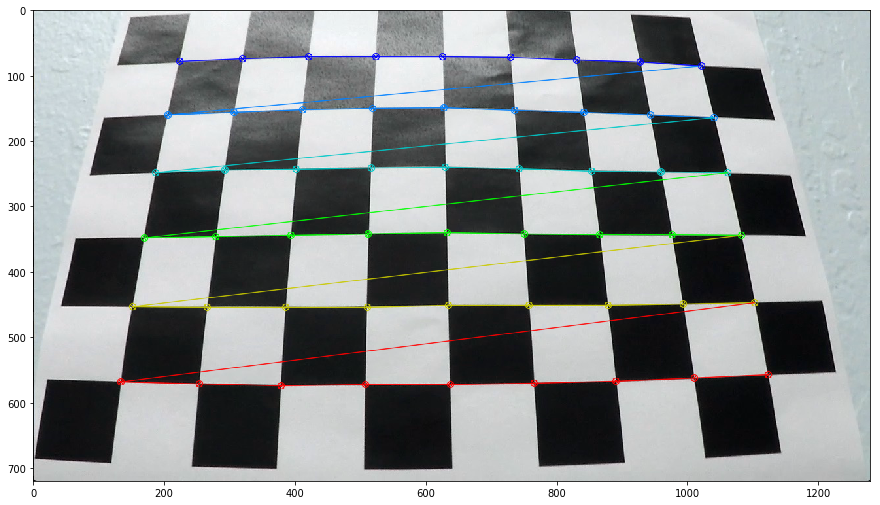

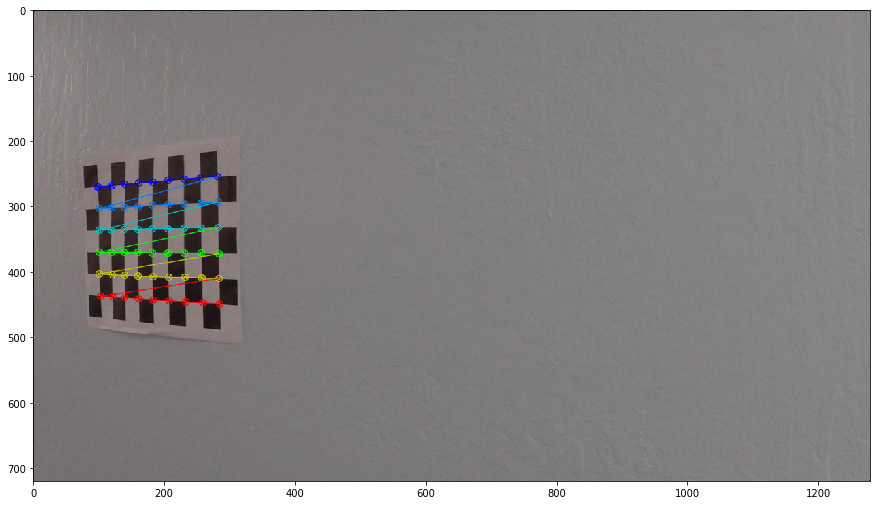

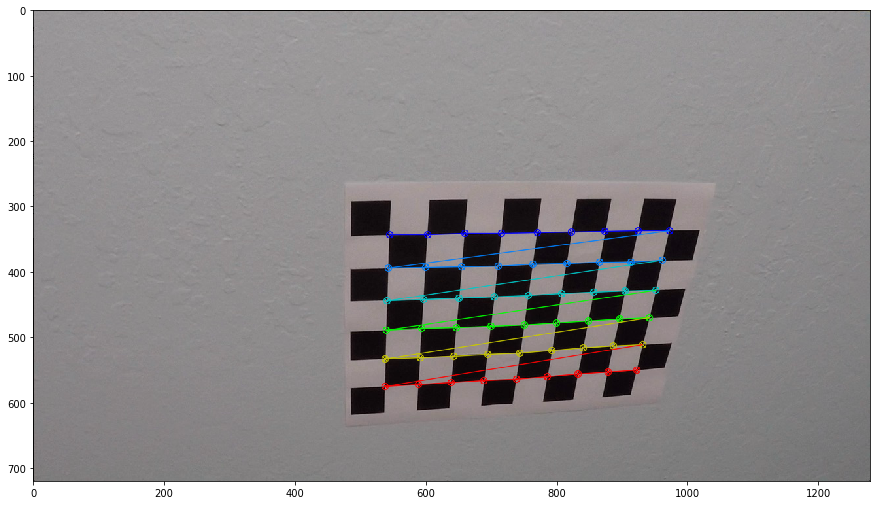

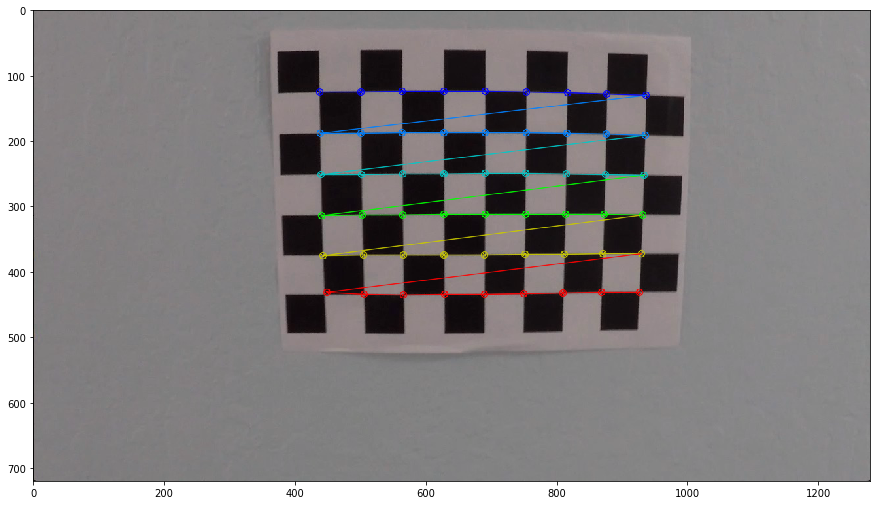

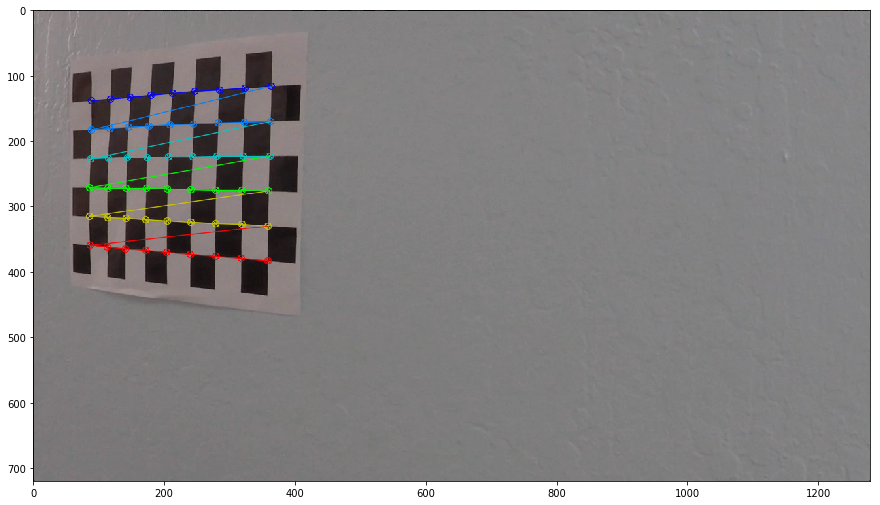

In [3]:
# Calibrate Camera (camera_calibration)
mtx, dist = camera_calibration("./camera_cal/calibration*.jpg", show=True)

# Distortion correction

In [4]:
def undistort_image(image, mtx, dist):
    '''
    returns an undistorted image (after camera calibration)
    '''

    dst = cv2.undistort(image, mtx, dist, None, mtx)

    return dst

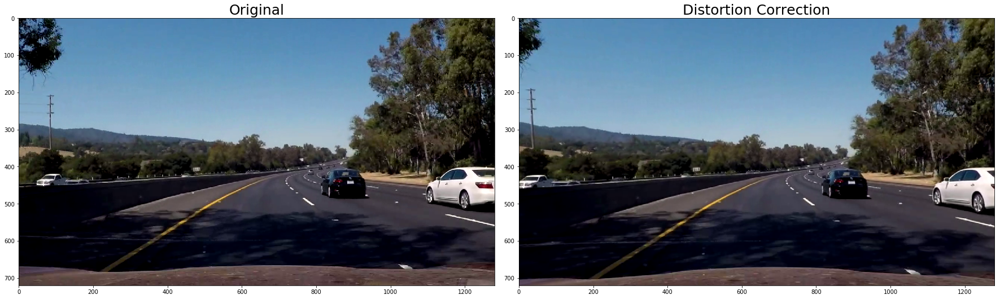

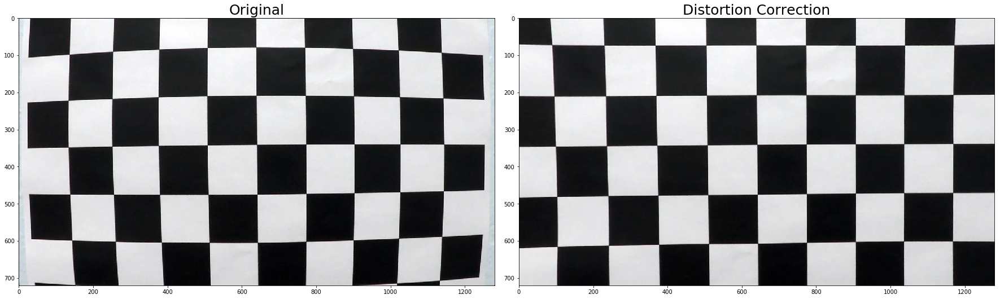

In [5]:
# Distortion Correction (undistort_image)
image = cv2.imread("test_images/prob6.jpg")
undistort_img = undistort_image(image, mtx, dist)

image2 = cv2.imread("camera_cal/calibration1.jpg")
undistort_img2 = undistort_image(image2, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
ax1.set_title('Original', fontsize=25)
ax2.imshow(cv2.cvtColor(undistort_img, cv2.COLOR_BGR2RGB))
ax2.set_title('Distortion Correction', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax3, ax4) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(image2)
ax3.set_title('Original', fontsize=25)
ax4.imshow(undistort_img2)
ax4.set_title('Distortion Correction', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Thresholded binary image

In [6]:
def apply_sobel(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    '''
    Define a function that takes an image, gradient orientation,
    and threshold min / max values.
    '''
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply x or y gradient with the OpenCV Sobel() function
    if orient == "x":
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == "y":
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # Take the absolute value
    abs_sobel = np.absolute(sobel)
    # Resale back to 8 bit integer
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    # Create a binary image of ones where threshold is met, zeros otherwise
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the binary image
    return sobel_binary

def magnitude_gradient(img, sobel_kernel=3, mag_thresh=(0, 255)):
    '''
    Define a function to return the magnitude of the gradient
    for a given sobel kernel size and threshold values
    '''

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # Create a binary image of ones where threshold is met, zeros otherwise
    magnitude_binary = np.zeros_like(gradmag)
    magnitude_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return magnitude_binary

def direction_gradient(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    '''
    Define a function to threshold an image for a given range and Sobel kernel
    '''

    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction,
    # apply a threshold, and create a binary image result
    direction_gradient = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    direction_binary =  np.zeros_like(direction_gradient)
    direction_binary[(direction_gradient >= dir_thresh[0]) & (direction_gradient <= dir_thresh[1])] = 1

    # Return the binary image
    return direction_binary

def combined_threshold(img, img_show=False):

    # Choose a Sobel kernel size
    ksize = 5

    sobelx_binary = apply_sobel(img, orient='x', sobel_kernel=ksize, thresh=(30, 100))
    sobely_binary = apply_sobel(img, orient='y', sobel_kernel=ksize, thresh=(30, 100))
    mag_binary = magnitude_gradient(img, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = direction_gradient(img, sobel_kernel=ksize, dir_thresh=(0.7, 1.3))

    # Combined different binary threshold
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((sobelx_binary == 1) & (sobely_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    if img_show == True:
        f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Undistorted Image', fontsize=15)
        ax2.imshow(sobelx_binary, cmap='gray')
        ax2.set_title('Sobel', fontsize=15)
        ax3.imshow(mag_binary, cmap='gray')
        ax3.set_title('Magnitude Gradient', fontsize=15)
        ax4.imshow(dir_binary, cmap='gray')
        ax4.set_title('Direction Gradient', fontsize=15)
        ax5.imshow(combined_binary, cmap='gray')
        ax5.set_title('Combined Gradient', fontsize=15)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()

    # Return the combined binary image
    return combined_binary

def color_gradient_threshold(img, img_show=False):

    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    l_channel = hls[:, :, 1]
    s_channel = hls[:, :, 2]

    # Threshold color channel
    l_thresh_min = 120
    l_thresh_max = 255

    s_thresh_min = 170
    s_thresh_max = 255

    # L channel avoid pixels which have shadows.
    l_binary = np.zeros_like(l_channel)
    l_binary = (l_channel > l_thresh_min) & (l_channel <= l_thresh_max)

    # S channel performs well for detecting bright yellow and white lanes
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    combining_sobel_threshold = combined_threshold(img, img_show=False)

    # Combined all the binary thresholds
    color_gradient_binary = np.zeros_like(combining_sobel_threshold)
    color_gradient_binary[(l_binary == 1) & (s_binary == 1) | (combining_sobel_threshold == 1)] = 1

    if img_show == True:
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Undistorted Image', fontsize=15)
        ax2.imshow(combining_sobel_threshold, cmap='gray')
        ax2.set_title('Combined Sobel', fontsize=15)
        ax3.imshow(s_binary, cmap='gray')
        ax3.set_title('S Channel', fontsize=15)
        ax4.imshow(color_gradient_binary, cmap='gray')
        ax4.set_title('Color & Sobel Gradient', fontsize=15)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()

    return color_gradient_binary

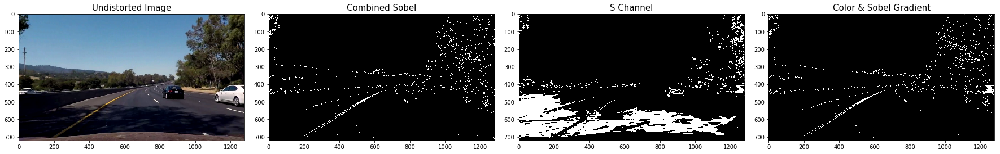

In [7]:
# Color and Sobel Binary Image (color_gradient_threshold)
color_gradient_binary = color_gradient_threshold(undistort_img, img_show=True)

# Perspective Transform

In [8]:
def perspective_transform(img, img_show=False):

    img_size = (img.shape[1], img.shape[0])

    # Four source coordinates
    src = np.float32(
            [[280,  700],  # Bottom left
             [595,  460],  # Top left
             [725,  460],  # Top right
             [1125, 700]]) # Bottom right

    dst = np.float32(
            [[250,  720],  # Bottom left
             [250,    0],  # Top left
             [1065,   0],  # Top right
             [1065, 720]]) # Bottom right   

    # Compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)

    Minv = cv2.getPerspectiveTransform(dst, src)

    warped_image = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    if img_show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img, cmap='gray')
        ax1.set_title('Color and Gradient Image', fontsize=15)
        ax2.imshow(warped_image, cmap='gray')
        ax2.set_title('Warped Image', fontsize=15)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        plt.show()

    return warped_image, M, Minv

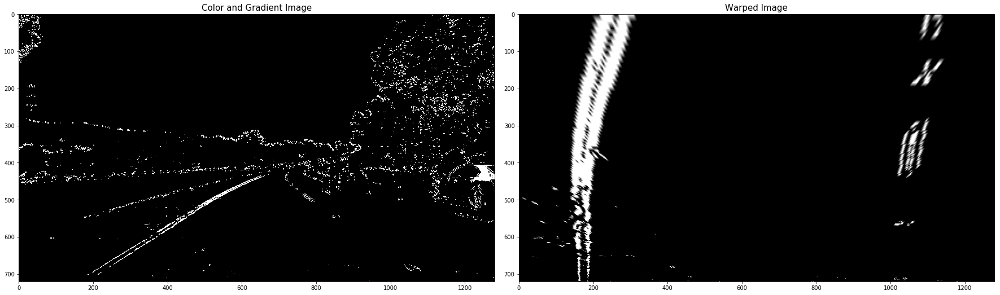

In [9]:
# Perspective Transform (perspective_transform)
warped_image, M, Minv = perspective_transform(color_gradient_binary, img_show=True)

# Find lane pixels (Sliding Window Search)

In [10]:
def find_lane_pixels(binary_warped):

    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0] // nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped, leftx, lefty, rightx, righty, out_img, img_show=False):

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])

    try:
        left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
        right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1 * ploty ** 2 + 1 * ploty
        right_fitx = 1 * ploty ** 2 + 1 * ploty

    if img_show == True:
        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]

        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

    return left_fit, right_fit, out_img

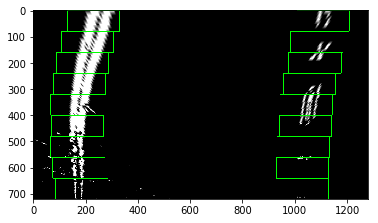

In [11]:
# Sliding Window (find_lane_pixels)
leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped_image)
plt.imshow(out_img/255)

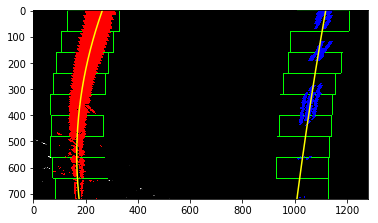

In [12]:
# Fit Polynomial (fit_polynomial)
left_fit, right_fit, out_img = fit_polynomial(warped_image, leftx, lefty, rightx, righty, out_img, img_show=True)
plt.imshow(out_img/255)

In [13]:
def search_line_further(binary_warped, left_fit, right_fit, img_show=False):

    # Choose the width of the margin around the previous polynomial to search
    margin = 80

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Set the area of search based on activated x-values
    # within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy +
                                   left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy ** 2) +
                                                                         left_fit[1] * nonzeroy + left_fit[
                                                                             2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy +
                                    right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy ** 2) +
                                                                           right_fit[1] * nonzeroy + right_fit[
                                                                               2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])

    #Calc both polynomials using ploty, left_fit and right_fit
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]

    if img_show == True:
        ## Visualization ##
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))

        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        # Plot the polynomial lines onto the image
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        ## End visualization steps ##
        return left_fitx, right_fitx, ploty, result

    return left_fitx, right_fitx, ploty

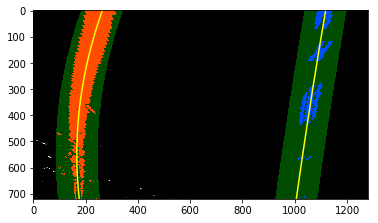

In [14]:
left_fitx, right_fitx, ploty, result = search_line_further(warped_image, left_fit, right_fit, img_show=True)
plt.imshow(result / 255)
plt.show()

# left_fitx, right_fitx, ploty = search_line_further(warped_image, left_fit, right_fit, img_show=False)

# Curvature of the lane and Vehicle position

In [15]:
def measure_curvature_radius(left_fit, right_fit, left_fitx, right_fitx, ploty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])

    # Calculate vehicle center
    # left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0] * y_eval) ** 2 + left_fit[0] * y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0] * y_eval) ** 2 + right_fit[0] * y_eval + right_fit[2]

    # Lane center as mid of left and right lane bottom
    lane_center = (left_lane_bottom + right_lane_bottom) / 2.
    center_image = 640
    center = (lane_center - center_image) * xm_per_pix  # Convert to meters

    return left_curverad, right_curverad, center

In [16]:
left_curvature, right_curvature, center = measure_curvature_radius(left_fit, right_fit, 
                                                                   left_fitx, right_fitx, ploty)

print("Left Curvature: {:.2f} m".format(left_curvature))
print("Right Curvature: {:.2f} m".format(right_curvature))
print("Center: {:.2f} m".format(center))

Left Curvature: 510.62 m
Right Curvature: 7613.64 m
Center: 0.27 m


# Draw on Image

In [17]:
def draw_image(undist_img, binary_warped, left_fitx, right_fitx, ploty, Minv, 
               left_curverad, right_curverad, center):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    new_warp = cv2.warpPerspective(color_warp, Minv, (undist_img.shape[1], undist_img.shape[0]))

    draw_line_image = cv2.addWeighted(undist_img, 1, new_warp, 0.3, 0)

    final_image = draw_line_image.copy()

    if center < 0:
        position = "left"
    else:
        position = "right"

    cv2.putText(final_image, 'Left lane line curvature: {:.2f} m'.format(left_curverad),
                (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3)
    cv2.putText(final_image, 'Right lane line curvature: {:.2f} m'.format(right_curverad),
                (60, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3)
    cv2.putText(final_image, 'Vehicle is {:.2f} m {}'.format(center, position),
                (60, 170), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3)
    
#     # Convert final image from BGR to RGB because the image is read with cv2
#     final_image = cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB)

    # Combine the result with the original image
    return final_image

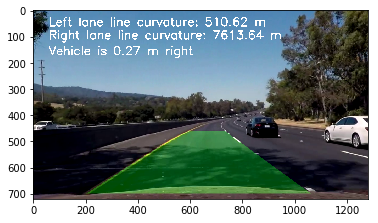

In [18]:
result = draw_image(undistort_img, warped_image, left_fitx, right_fitx, ploty, Minv, 
                    left_curvature, right_curvature, center)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

In [ ]:
# Run all the test images and saving it inside the folder "test_images"
test_images = os.listdir("test_images/")
print(test_images)

for i in test_images:
    i = 'test_images/' + i
    image = mpimg.imread(i)
    images = adv_lane_finding(image, mtx, dist)
    file_name = i[:len(i) - 4] + '-output.jpg'
    plt.imsave(file_name, images)

# Create a pipeline to run a video

In [19]:
class Pipeline:
    def __init__(self, cal_path):
        # Make a list of calibration images

        # Calibrate camera
        self.mtx, self.dist = camera_calibration(cal_path)
        
        # Reinitialize 
        self.left_fit = None
        self.right_fit = None
        self.leftx = None
        self.lefty = None
        self.rightx = None
        self.righyy = None
        self.ploty = None
        self.left_fitx = None
        self.right_fitx = None

    def __call__(self, img):
        
        # STEP 1: UNDISTORT (using camera calibration step matrix and dist)
        undistort_img = undistort_image(img, self.mtx, self.dist)

        # STEP 2: APPLY COLOR SPACE TRANSFORM AND SOBEL THRESHOLDING
        gradient_binary = color_gradient_threshold(undistort_img)
        
        # Apply a perspective transform to rectify binary image ("birds-eye view")  
        # STEP 3: WARP BINARY IMAGE INTO TOP-DOWN VIEW
        warped_image, M, Minv = perspective_transform(gradient_binary)
        
        
        # STEP 4: Detect lane pixels and fit to find the lane boundary
        self.leftx, self.lefty, self.rightx, self.righty, out_img = find_lane_pixels(warped_image)
        
        self.left_fit, self.right_fit, out_img = fit_polynomial(warped_image, self.leftx, self.lefty, 
                                                                self.rightx, self.righty, out_img, img_show=False)
        
        self.left_fitx, self.right_fitx, self.ploty = search_line_further(warped_image, self.left_fit, 
                                                                          self.right_fit, img_show=False)
        
        # STEP 5: Measure curvature of lines
        left_curvature, right_curvature, center = measure_curvature_radius(self.left_fit, self.right_fit, 
                                                                   self.left_fitx, self.right_fitx, self.ploty)
        

        # STEP 6: Warp the detected lane boundaries back onto the original image.
        output_image = draw_image(undistort_img, warped_image, self.left_fitx, self.right_fitx, 
                                  self.ploty, Minv, left_curvature, right_curvature, center)
            
        return output_image

# Example result using Pipeline

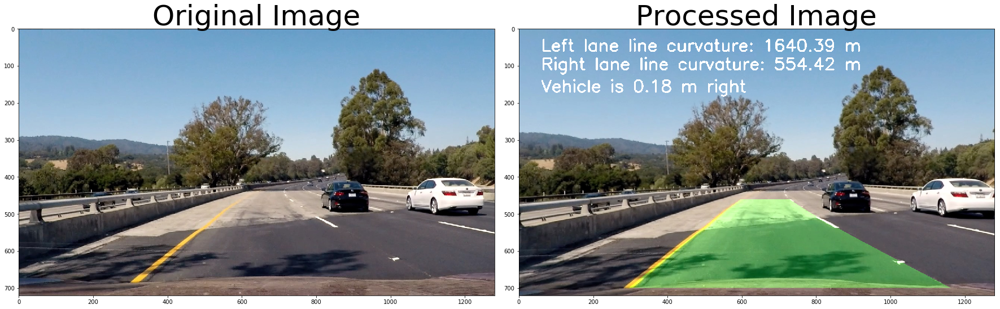

In [20]:
img = cv2.imread('test_images/test4.jpg')

# Process video frames with our 'process_image' function
process_image = Pipeline('./camera_cal/calibration*.jpg')

# Apply pipeline
processed = process_image(img)

# Plot the 2 images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(cv2.cvtColor(processed, cv2.COLOR_BGR2RGB))
ax2.set_title('Processed Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Applying Pipeline to the video

In [21]:
def apply_video(input_video, output_video):

    # Process video frames with our 'process_image' function
    process_image = Pipeline('./camera_cal/calibration*.jpg')
    
    ## You may uncomment the following line for a subclip of the first 5 seconds
    #clip1 = VideoFileClip(input_video).subclip(0,5)
    clip1 = VideoFileClip(input_video)
    white_clip = clip1.fl_image(process_image)
    %time white_clip.write_videofile(output_video, audio=False)
    
    print("Apply video pipeline: SUCCESS!")

In [22]:
input_video = './test_videos/project_video.mp4'
output_video = './output_videos/project_video_output.mp4'

apply_video(input_video, output_video)

[MoviePy] >>>> Building video ./output_videos/project_video_output.mp4
[MoviePy] Writing video ./output_videos/project_video_output.mp4


100%|█████████▉| 1260/1261 [06:51<00:00,  2.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/project_video_output.mp4 

CPU times: user 4min 40s, sys: 3.1 s, total: 4min 43s
Wall time: 6min 54s
Apply video pipeline: SUCCESS!


In [ ]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(output_video))

In [23]:
input_video = './test_videos/challenge_video.mp4'
output_video = './output_videos/challenge_video_output.mp4'

apply_video(input_video, output_video)

[MoviePy] >>>> Building video ./output_videos/challenge_video_output.mp4
[MoviePy] Writing video ./output_videos/challenge_video_output.mp4


100%|██████████| 485/485 [02:34<00:00,  3.16it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/challenge_video_output.mp4 

CPU times: user 1min 46s, sys: 1.17 s, total: 1min 48s
Wall time: 2min 37s
Apply video pipeline: SUCCESS!


In [ ]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(output_video))